In [3]:
%autoreload 2

In [1]:
%reload_ext autoreload
import os, sys, ast
import numpy as np
import pandas as pd
import seaborn as sns
import tifffile

import matplotlib.pyplot as plt
from matplotlib import gridspec, rcParams
from fish import Gafftopsail
sys.path.append(r'C://Users//Zichen//anaconda3//envs//2ptank//Lib//site-packages//')
import utils, barcode
rcParams['font.size'] = 10

In [2]:
#load atlas
template_path = "C:\Data\MapZBrainATLAS\T_AVG_HuCD.tif"
template = tifffile.imread(template_path)

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\Zichen\AppData\Local\Temp\ipykernel_33188\4158968567.py:2: SyntaxWarning: invalid escape sequence '\D'
  template_path = "C:\Data\MapZBrainATLAS\T_AVG_HuCD.tif"


In [24]:
def plot_rank(ranks_df, stim_matrix):
    region_list = [['prosencephalon_(forebrain)', 'mesencephalon_(midbrain)'], 'rhombencephalon_(hindbrain)']
    #region_list = ['i']

    fig, ax = plt.subplots(len(stim_matrix), stim_matrix.shape[1], dpi=240, figsize=(15, 40))

    #only plot visually responsive neurons that have been somewhat barrcoded
    #barred = list(fo_f.index[(fo_f.filter(like=f"barred_").any(axis=1)) & (fo_f['DSI2'] > 0.5)])

    for rown in range(stim_matrix.shape[0]):
        for coln in range(stim_matrix.shape[1]):
            stim = stim_matrix[rown, coln]
            ax_imshow = ax[rown, coln]
            if stim != 'skip':
                print(stim)
                ax_imshow.imshow(template[140], cmap = 'gray_r', vmax = 6000)
                for fish in ranks_df.fish_id.unique():
                    fish_ranks = ranks_df[ranks_df['fish_id'] == fish]
                    #normalize ranks
                    min_rank = np.nanmin(fish_ranks[stim])
                    max_rank = np.nanmax(fish_ranks[stim])
                    fish_ranks_norm = (fish_ranks[stim] - min_rank) / (max_rank - min_rank)
                    cmap = plt.cm.turbo
                    mask = [not np.isnan(r) for r in fish_ranks_norm]
                    colors = [cmap(r) for r in fish_ranks_norm if not np.isnan(r)]
                    ax_imshow.scatter(np.array(fish_ranks.xpos)[mask],np.array(fish_ranks.ypos)[mask],
                        color=colors,s=.1,marker='.')
            ax_imshow.set_axis_off()
            ax_imshow.set_title(stim)
    return fig

In [5]:

paths = [r"C:\Data\Imaging\250912_overlap\fish3",
r"C:\Data\Imaging\250912_overlap\fish2_2",
         r"C:\Data\Imaging\250912_overlap\fish5_2",
         r"C:\Data\Imaging\250912_overlap\fish9",
r"C:\Data\Imaging\250912_overlap\fish8",
         r"C:\Data\Imaging\250912_overlap\fish15",
r"C:\Data\Imaging\250912_overlap\fish13",
r"C:\Data\Imaging\250912_overlap\fish14"]
# paths =      [r"C:\Data\Imaging\251021_dotsweep\fish5_overlap",
#  r"C:\Data\Imaging\251021_dotsweep\fish4_overlap",
#  r"C:\Data\Imaging\251021_dotsweep\fish3_overlap"]
paths = [
r"C:\Data\Imaging\251224_overlap\fish3_HB",
r"C:\Data\Imaging\251224_overlap\fish5",
r"C:\Data\Imaging\251224_overlap\fish5_HB",
r"C:\Data\Imaging\251224_overlap\fish1",
r"C:\Data\Imaging\251224_overlap\fish1_HB",
r"C:\Data\Imaging\251224_overlap\fish2",
r"C:\Data\Imaging\251224_overlap\fish2_HB",
r"C:\Data\Imaging\251224_overlap\fish3"]

ranks_df = []
for path in paths:
    rank_df = pd.read_csv(path + '//analyze_results//hierarchicalclustering_ranks_df.csv', index_col = 0)
    #grating_response = pd.read_csv(path + '//analyze_results//grating_responses.csv', index_col = 0)
    new_poses = []
    neuron_count = 0
    for plane in range(5):
        new_pos = pd.read_csv(path + f'//Imaging//plane_{plane}//Alignment//new_pos.csv', converters={"regions": ast.literal_eval})
        # stat = np.load(path + f'//Imaging//plane_{plane}//'+ 'stat.npy', allow_pickle=True)
        # avg_xpos = np.array([np.mean(cell['ypix']) for cell in stat])
        # avg_ypos = np.array([np.mean(cell['xpix']) for cell in stat])
        # avg_zpos = np.array([plane] * len(avg_xpos))
        # new_pos = pd.DataFrame(data = np.array([avg_xpos, avg_ypos, avg_zpos]).T,
        #                                    columns = ['xpos', 'ypos', 'zpos'],
        #                                    index = np.add(range(len(avg_xpos)), neuron_count))
        # neuron_count += len(avg_xpos)
        new_poses.append(new_pos)
    new_poses = pd.concat(new_poses, ignore_index = True)
    rank_df = pd.concat([rank_df, new_poses], ignore_index = False, axis = 1)
    rank_df.loc[:, 'fish_id'] = path
    ranks_df.append(rank_df)
ranks_df = pd.concat(ranks_df).reset_index()



dot_l
dot_r
forward
['dot_l', 'forward']
['dot_r', 'forward']
left
['dot_l', 'left']
['dot_r', 'left']
right
['dot_l', 'right']
['dot_r', 'right']
backward
['dot_l', 'backward']
['dot_r', 'backward']


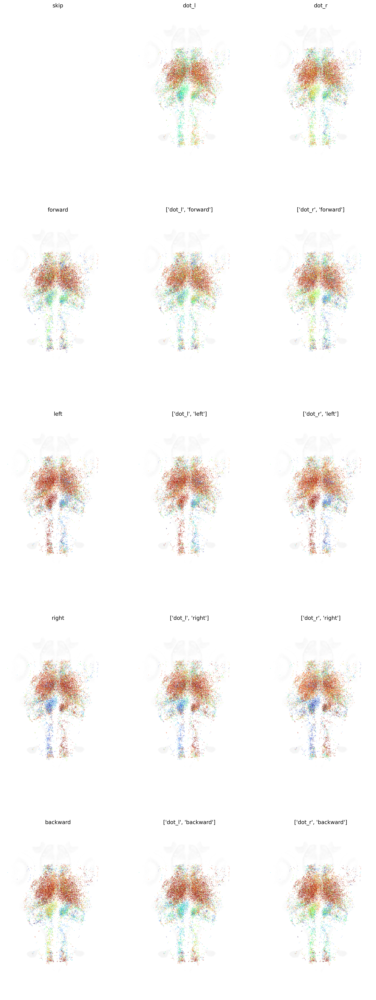

In [25]:
stim_matrix = np.array([['skip', 'dot_l', 'dot_r'],
                        ['forward', str(['dot_l', 'forward']), str(['dot_r', 'forward'])],
                        ['left', str(['dot_l', 'left']), str(['dot_r', 'left'])],
                        ['right', str(['dot_l', 'right']), str(['dot_r', 'right'])],
                        ['backward', str(['dot_l', 'backward']), str(['dot_r', 'backward'])]])
fig = plot_rank(ranks_df, stim_matrix)
plt.savefig(r"C:\Data\Imaging\251224_overlap\All_imaging//clusterrank.png")
plt.show()
plt.close()

dot_l-dot_r
['dot_l', 'forward']-['dot_r', 'forward']
['dot_l', 'left']-['dot_r', 'left']
['dot_l', 'right']-['dot_r', 'right']
['dot_l', 'backward']-['dot_r', 'backward']


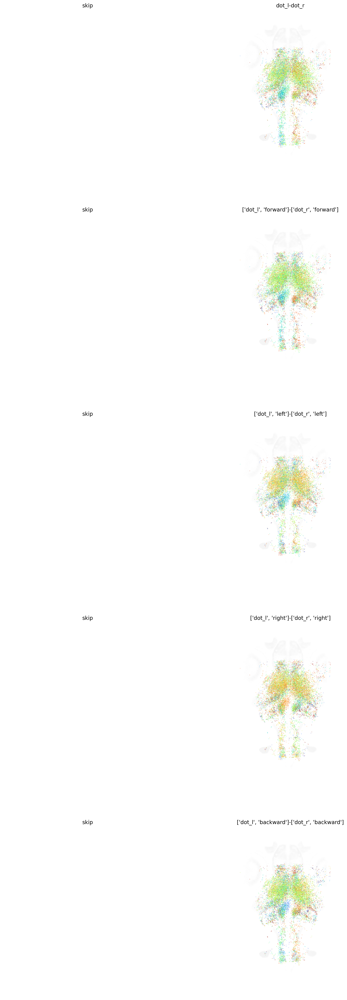

In [26]:
stim_matrix = np.array([['skip', 'dot_l-dot_r'],
                        ['skip', f"{str(['dot_l', 'forward'])}-{str(['dot_r', 'forward'])}"],
                        ['skip', f"{str(['dot_l', 'left'])}-{str(['dot_r', 'left'])}"],
                        ['skip', f"{str(['dot_l', 'right'])}-{str(['dot_r', 'right'])}"],
                        ['skip', f"{str(['dot_l', 'backward'])}-{str(['dot_r', 'backward'])}"]])
fig = plot_rank(ranks_df, stim_matrix)
plt.savefig(r"C:\Data\Imaging\251224_overlap\All_imaging//clusterrank_compare.png")
plt.show()
plt.close()